<center>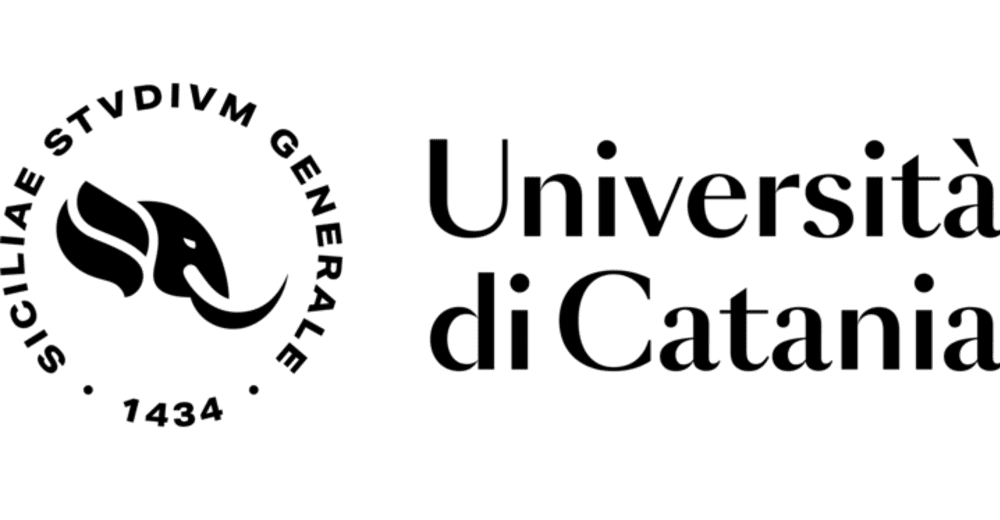

<center><h3>DATA SCIENCE FOR MANAGEMENT - LM 91</h3>
<h1>Midi Music Generator using LSTM</h1>

# Introduction
The aim of this homework is to build a LSTM architecture using PyTorch to generate a MIDI music file by using as dataset several music styles.

# Params definition

Define training parameters and install required libraries.

In [1]:
BATCH_SIZE = 32
SEQUENCE_LENGTH = 50 # LOWERED TO 50 WHEN DIFFERENT STYLES ARE CHOOSEN
EMBEDDING_SIZE = 256
RNN_SIZE = 1024

NUM_ITERS=1000

In [2]:
!pip install mitdeeplearning -q
!apt-get -qq install abcmidi timidity > /dev/null 2>&1

     |████████████████████████████████| 2.1 MB 31.2 MB/s 


In [3]:
import mitdeeplearning as mdl

# Import all remaining packages
import torch
import torch.nn as nn
import torch.nn.functional as F
torch.manual_seed(21)

import numpy as np
np.random.seed(21)

import os
import time
import functools
from IPython import display as ipythondisplay
from tqdm import tqdm

import os
from pathlib import Path

import random
random.seed(21)

from matplotlib import pyplot as plt

# Dataset creation

Data preparation steps:

1.   Find MIDI files and convert to ABC
2.   Read ABC songs and create dataset (list of songs)
3.   Create vocabolary 
4.   Preprocess songs
5.   Create batch function



### 1.   Find MIDI files and convert to ABC

Data can be downloaded by GitHub repo:

In [8]:
!wget https://github.com/ric-sar/hw_midi_generator/raw/main/data.zip
!unzip -q data.zip
!rm -rf sample_data
!rm -f data.zip

--2022-11-20 10:45:50--  https://github.com/ric-sar/hw_midi_generator/raw/main/data.zip
Resolving github.com (github.com)... 20.205.243.166
Connecting to github.com (github.com)|20.205.243.166|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/ric-sar/hw_midi_generator/main/data.zip [following]
--2022-11-20 10:45:50--  https://raw.githubusercontent.com/ric-sar/hw_midi_generator/main/data.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 982897 (960K) [application/zip]
Saving to: ‘data.zip’

data.zip            100%[===================>] 959.86K  --.-KB/s    in 0.006s  

2022-11-20 10:45:50 (163 MB/s) - ‘data.zip’ saved [982897/982897]

replace data/dance/2_Unlimited_-_Get_Ready_for_This.mid? [y]

Here we present an option menu to choose in which music styles will be generated:

In [9]:
# Check if there are .abc files and delete it
!find . -name "*.abc" -type f -delete

# Check if folders have been created
!rm -rf ./data/dance_pop
!rm -rf ./data/dance_rock
!rm -rf ./data/pop_rock
!rm -rf ./data/all_styles

# Menu to choose the style to generate
while True:
    print("**************************\nYou can choose between:")
    print ("1. Dance\n2. Pop\n3. Rock\n4. Mix of Dance and Pop\n5. Mix of Dance and Rock\n6. Mix of Pop and Rock\n7. All styles")
    n = input("Enter the number: ")
    if n == "1":
        print("\nDance chosen\n")
        root_dir = Path("./data/dance")
        break
    elif n == "2":
        print("\nPop chosen\n")
        root_dir = Path("./data/pop")
        break
    elif n == "3":
        print("\nRock chosen\n")
        root_dir = Path("./data/rock")
        break
    elif n == "4":
        print("\nMix of Dance and Pop\n")
        os.mkdir("./data/dance_pop")
        !cp ./data/dance/*.mid ./data/dance_pop
        !cp ./data/pop/*.mid ./data/dance_pop
        root_dir = Path("./data/dance_pop")
        break
    elif n == "5":
        print("\nMix of Dance and Rock\n")
        os.mkdir("./data/dance_rock")
        !cp ./data/dance/*.mid ./data/dance_rock
        !cp ./data/rock/*.mid ./data/dance_rock
        root_dir = Path("./data/dance_rock")
        break
    elif n == "6":
        print("\nMix of Pop and Rock\n")
        os.mkdir("./data/pop_rock")
        !cp ./data/pop/*.mid ./data/pop_rock
        !cp ./data/rock/*.mid ./data/pop_rock
        root_dir = Path("./data/pop_rock")
        break
    elif n == "7":
        print("\nAll styles\n")
        os.mkdir("./data/all_styles")
        !cp ./data/dance/*.mid ./data/all_styles
        !cp ./data/pop/*.mid ./data/all_styles
        !cp ./data/rock/*.mid ./data/all_styles
        root_dir = Path("./data/all_styles")
        break
    else:
        print("The option number must be in the menu\n")

# Convert midi to abc
print("*** Start conversion of midi to abc ***")
!find data -type f -exec midi2abc {} -o {}.abc \;
print("*** End conversion ***")

**************************
You can choose between:
1. Dance
2. Pop
3. Rock
4. Mix of Dance and Pop
5. Mix of Dance and Rock
6. Mix of Pop and Rock
7. All styles
Enter the number: 7

All styles

*** Start conversion of midi to abc ***
Error: Time=0 Track=9 Note terminated when not on - pitch 65
Error: Time=0 Track=12 Note terminated when not on - pitch 80
Advancing by 0 in printtrack!
Error in MIDI file - notes still on at end of track!
Error in MIDI file - notes still on at end of track!
Error in MIDI file - notes still on at end of track!
Error in MIDI file - notes still on at end of track!
Error in MIDI file - notes still on at end of track!
Error in MIDI file - notes still on at end of track!
Error in MIDI file - notes still on at end of track!
Error in MIDI file - notes still on at end of track!
Error in MIDI file - notes still on at end of track!
Error: Time=0 Track=9 Note terminated when not on - pitch 65
Error: Time=0 Track=12 Note terminated when not on - pitch 80
Error in MIDI

### 2.   Read ABC songs and create dataset (list of songs)


**What is ABC notation?**

https://en.wikipedia.org/wiki/ABC_notation

ABC notation is a shorthand form of musical notation for computers. In basic form it uses the letter notation with a–g, A–G, and z, to represent the corresponding notes and rests, with other elements used to place added value on these – sharp, flat, raised or lowered octave, the note length, key, and ornamentation. 

The ABC notation of music does not simply contain information on the notes being played, but additionally there is meta information such as the song title, key, and tempo and instrument. 

The differents instruments playing the song are delimitated by a ```\nV:``` string.
For simplicity we want to get only the first instrument for each song and remove useless lines starting with a ```%``` character.

ABC file example:

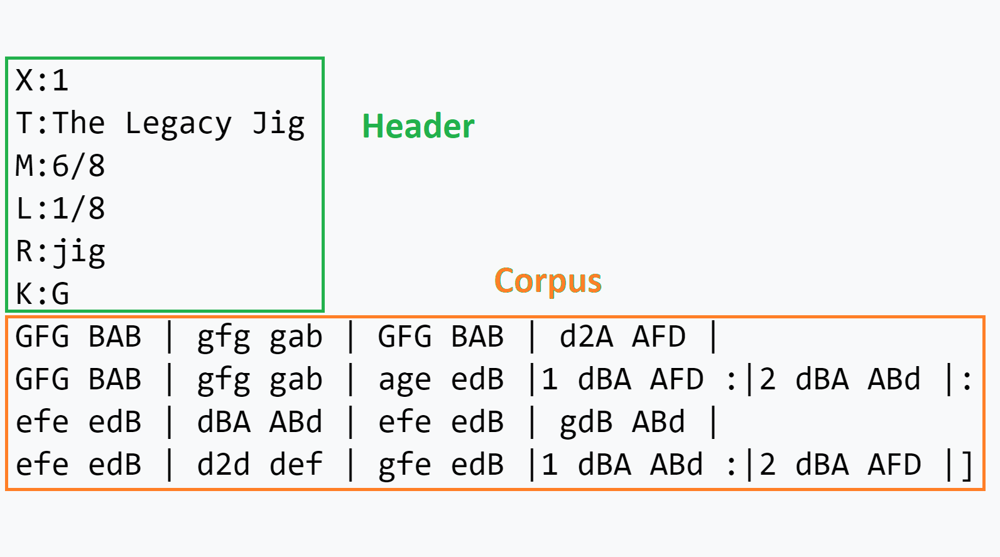

In [10]:
# Search for .abc data in our dataset folder
fnames = sorted([x for x in os.listdir(root_dir) if x.endswith(".abc")])

songs = []

# Read and process each song
for fname in fnames:
  with open(root_dir/fname) as f:
    try:
      data = f.read()
      # Split song on different instruments (\nV:) and take only first
      text = data.split("\nV:")[0] + data.split("\nV:")[1]
      # Remove comments and useless lines
      text = "\n".join([x for x in text.split("\n") if x[0] != "%"])
      # Append song to the 'songs' list
      songs.append(text.replace("from midi_data/", "").replace(".mid", ""))
    except:
      pass

print(f"The dataset consists of {len(songs)} songs.")

The dataset consists of 109 songs.


In [11]:
# Print the first 300 characters of the fist song
print(songs[0][:300])

X: 1
T: from data/all_styles/2_Unlimited_-_Get_Ready_for_This
M: 4/4
L: 1/8
Q:1/4=125
K:C % 0 sharps1
x8| \
x8| \
x8| \
x8|
x8| \
x8| \
x8| \
x8|
x8| \
E,,,3/2E,,,/2 B,,,,E,,, A,,,,A,,,, B,,,,B,,,| \
E,,,3/2E,,,/2 B,,,,E,,, G,,,G,,, A,,,A,,,,| \
E,,,3/2E,,,/2 B,,,,E,,, A,,,,A,,,, B,,,,B,,,|
E,,,3/2E


### 3.   Create vocabolary

Before we begin training our RNN model, we'll need to create a numerical representation of our text-based dataset. To do this, we'll generate two lookup tables: one that maps characters to numbers, and a second that maps numbers back to characters. Recall that we just identified the unique characters present in the text.

3.1 Create a vocabulary for the songs and define numerical representation of text.

In [ ]:
# Join our list of song strings into a single string containing all songs
joined_strings = '\n\n'.join(songs)

# Find all unique characters in the joined string
vocab = sorted(set(joined_strings))

# Create a mapping from character to unique index.
# For example, to get the index of the character "d", 
# we can evaluate `char2idx["d"]`.  
char2idx = {char: i for i,char in enumerate(vocab)}

# Create a mapping from indices to characters. This is
# the inverse of char2idx and allows us to convert back
# from unique index to the character in our vocabulary.
idx2char = {i: char for i,char in enumerate(vocab)}

3.2 Create a vocabulary of the song keys to be provided, as additional input, to the model in order to control the song generation.

In [ ]:
# Extract keys
rows = ("\n".join(songs)).split("\n")
keys = sorted(list(set([x.split(" ")[0][2:] for x in rows if x[:2] == "K:"])))

# Create keys vocabulary
keys2idx = {key: i for i,key in enumerate(keys)}
idx2keys = {i: key for i,key in enumerate(keys)}

### 4. Preprocessing songs

Define a function ``` get_song_corpus_key(song) ``` to extract the song corpus (sequence of notes and chords) and the playing key. The output is a dict containing both the corpus and the key for the passed song. 

In [ ]:
def get_song_corpus_key(string):
    # Split song lines
  splitted_string = string.split("\n")
  # Get song header (title, time, key, ...)
  header = splitted_string[:6]
  key = [x.split(" ")[0][2:] for x in header if x[:2] == "K:"][0]
  
  # Get song corpus (notes)
  corpus = splitted_string[6:]
  # Remove song pauses
  corpus = [l for l in corpus if len(l)>8]
  corpus = "\n".join(corpus)

  return {"key": key, "song": corpus}

Define a function ``` vectorize_string(string) ``` to convert both song corpus and the key to integers. The function internally calls the ``` get_song_corpus_key(song) ``` function to receive extract the two requirede elements for the passed song and than has to convert them to integers using the created vocabularies.

In [ ]:
def vectorize_string(string):
  # Get song corpus and key
  song_dict = get_song_corpus_key(string)
  key = song_dict["key"]
  song = song_dict["song"]

  int_key = keys2idx[key]
  int_songs = [char2idx[char] for char in song]
  song_dict = {"key": int_key, "song": int_songs}
  
  return song_dict

In [ ]:
# Convert songs to their vector representation using the created function
vec_songs = [vectorize_string(x) for x in songs]

### 5. Get batch

In our text file, we saw that a song is a block of text that we converted int a vector representation. Each song has its own length. However, dealing with different sequence lengths may be difficult. For simplicity, when generating a batch, we will just get `N` random songs from our dataset, where N is the batch size. 

Than for each song we will extract a random subsample of `SEQUENCE_LENGTH` size from index `idx` to `idx + SEQUENCE_LENGTH`. For each input, the corresponding target will contain the same length of elements, except shifted one character to the right.

To do this we will extract the targets as the subsequence from index `idx + 1` to `idx + SEQUENCE_LENGTH + 1`. Suppose `SEQUENCE_LENGTH` is 4 and our text is "Hello". Then, our input sequence is "Hell" and the target sequence is "ello".

In [ ]:
### Batch definition to create training examples ###
def get_batch(vec_songs, seq_length, batch_size):
  sampled_songs = random.sample(vec_songs, batch_size)
  in_batch = []
  keys_batch = []
  tar_batch = []

  for song_dict in sampled_songs:
    key = song_dict["key"]
    song = song_dict["song"]
    idx = random.randrange(0, len(song) - seq_length - 1)
    in_batch.append(song[idx:(idx + seq_length)])
    keys_batch.append(key)
    tar_batch.append(song[(idx+1):(idx + seq_length + 1)])
      
  in_batch = torch.LongTensor(in_batch)
  keys_batch = torch.LongTensor(keys_batch)
  keys_batch = keys_batch.unsqueeze(1)
  tar_batch = torch.LongTensor(tar_batch)

  return in_batch, keys_batch, tar_batch

In [ ]:
in_batch, keys_batch, tar_batch = get_batch(vec_songs, SEQUENCE_LENGTH, BATCH_SIZE)
print(in_batch.shape)
print(keys_batch.shape)
print(tar_batch.shape)

torch.Size([32, 50])
torch.Size([32, 1])
torch.Size([32, 50])


# Music Generator

Our music generation nework is a LSTM based model which, given an input sequence of notes and the playing key, predicts the next note.

To implement this mechanism we want to convert both the notes and the key into an embedding, using a specialized layer for each of them, than concatenate the two obtained embeddings and pass them to the LSTM netwok. Finally a Linear layer predicts the next note.

1.   Create a `nn.Embedding` layer wich receives the **notes**, belonging to a `NUM_NOTES` sized vocabulary and produce an `EMBEDDING_SIZE` embedding.
2.   Create a `nn.Embedding` layer wich receives the **keys**, belonging to a `NUM_KEYS` sized vocabulary and produce an `EMBEDDING_SIZE` embedding.
3.   Create a `N` layers `nn.LSTM` wich receives an `EMBEDDING_SIZE * 2` sized input (we want to concatenate the embeddings coming from the notes and the keys).
4.   Create a final decoder predicting the next note (as a classifier 😉)

**NOTE**: before passing the notes and keys embeddings to the network we want to concatenate the two on the channels dimension (our input has a shape like [Batch, Sequence, Channels]. As the number of elements is different (you have only one key for a `SEQUENCE_LENGTH` sequence of notes) you have to replicate the keys on the sequence dimension (1) to have a size according to the length of your sequence `keys_embedding.repeat(1, SEQUENCE_LENGTH, 1)`


In [ ]:
class MusicGenerator(nn.Module):
    
    def __init__(self, vocab_size, num_keys, embed_size, rnn_size):
        # Call parent constructor
        super().__init__()
        # Store needed attributes
        self.rnn_size = rnn_size
        self.state = None
        # Define modules
        self.vocab_embedding = nn.Embedding(vocab_size, embed_size)
        self.keys_embedding = nn.Embedding(num_keys, embed_size)
        self.rnn = nn.LSTM(embed_size*2, rnn_size, batch_first=True)
        self.decoder = nn.Linear(rnn_size, vocab_size)
        self.logits = nn.Softmax(dim=1)

        # Flags
        self.reset_next_state = False

    def reset_state(self):
        # Mark next state to be re-initialized
        self.reset_next_state = True
    
    def forward(self, x, keys):
        # Implement forward pass (state reset, input embedding, ...)
        # Check state reset
        if self.reset_next_state:
            # Initialize state (num_layers x batch_size x rnn_size)
            self.state = (
                x.new_zeros(1, x.size(0), self.rnn_size).float(),
                x.new_zeros(1, x.size(0), self.rnn_size).float())
            # Clear flag
            self.reset_next_state = False

        # Embed data
        x = self.vocab_embedding(x)
        keys = self.keys_embedding(keys)
        keys = keys.repeat(1, x.shape[1], 1)
        x = torch.cat((x, keys), dim=2)

        # Process RNN
        state = self.state if self.state is not None else None
        x, state = self.rnn(x, state)
        self.state = (state[0].data, state[1].data)
        # Compute outputs
        x = self.decoder(x)
        return x

In [ ]:
dev = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = MusicGenerator(len(vocab), len(keys), EMBEDDING_SIZE, RNN_SIZE).to(dev)

In [ ]:
in_batch, keys_batch, tar_batch = get_batch(vec_songs, SEQUENCE_LENGTH, BATCH_SIZE)
pred = model(in_batch.to(dev), keys_batch.to(dev))
print(pred.shape)

torch.Size([32, 50, 77])


# Training procedure

In [ ]:
def train(model, optim, criterion, dataset, dev=torch.device('cpu')):
  try:
    model.to(dev)

    # Initialize training history
    loss_history = []

    # Set network mode
    model.train()

    for iter in range(NUM_ITERS):
      # reset model state 
      model.reset_state()

      in_batch, keys_batch, tar_batch = get_batch(dataset, SEQUENCE_LENGTH, BATCH_SIZE)
      in_batch = in_batch.to(dev)
      keys_batch = keys_batch.to(dev)
      tar_batch = tar_batch.to(dev)

      # Implement training
      # 1. Forward through network
      output = model(in_batch, keys_batch)

      # 2. Compute loss
      output = output.view(-1, len(vocab))
      target = tar_batch.view(-1)
      loss = F.cross_entropy(output, target)

      # 3. Backward loss
      optimizer.zero_grad()
      loss.backward()
      
      # 4. Update params
      optimizer.step()

      loss_history.append(loss)

      # Print info
      print(f"Iter: {iter+1}, loss: {loss_history[-1]:.4f}")
  except KeyboardInterrupt:
    print("Interrupted")
  finally: 
    # Plot loss
    plt.title("loss")
    plt.plot(loss_history, label="Train")
    plt.legend()
    plt.show()

Iter: 1, loss: 4.3433
Iter: 2, loss: 3.7068
Iter: 3, loss: 3.1970
Iter: 4, loss: 2.9109
Iter: 5, loss: 2.6561
Iter: 6, loss: 2.4476
Iter: 7, loss: 2.2610
Iter: 8, loss: 2.3737
Iter: 9, loss: 2.1782
Iter: 10, loss: 2.0645
Iter: 11, loss: 2.0868
Iter: 12, loss: 1.9873
Iter: 13, loss: 1.9063
Iter: 14, loss: 1.8319
Iter: 15, loss: 1.7871
Iter: 16, loss: 1.7395
Iter: 17, loss: 1.7702
Iter: 18, loss: 1.7092
Iter: 19, loss: 1.6512
Iter: 20, loss: 1.5591
Iter: 21, loss: 1.6434
Iter: 22, loss: 1.6195
Iter: 23, loss: 1.5533
Iter: 24, loss: 1.4685
Iter: 25, loss: 1.4310
Iter: 26, loss: 1.4165
Iter: 27, loss: 1.4205
Iter: 28, loss: 1.3809
Iter: 29, loss: 1.3776
Iter: 30, loss: 1.3216
Iter: 31, loss: 1.4104
Iter: 32, loss: 1.2827
Iter: 33, loss: 1.3607
Iter: 34, loss: 1.4518
Iter: 35, loss: 1.3159
Iter: 36, loss: 1.2332
Iter: 37, loss: 1.2630
Iter: 38, loss: 1.2677
Iter: 39, loss: 1.2941
Iter: 40, loss: 1.2840
Iter: 41, loss: 1.1599
Iter: 42, loss: 1.2395
Iter: 43, loss: 1.1676
Iter: 44, loss: 1.16

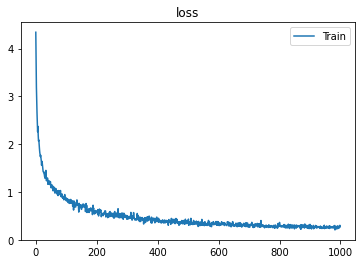

In [ ]:
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

train(model, optimizer, criterion, vec_songs, dev=dev)

In [ ]:
def generate_text(model, start_string, key, generation_length=1000):
  with torch.no_grad():
    input_eval = [char2idx[s] for s in start_string]
    # convert to tensor and add the batch dim
    input_eval = torch.tensor(input_eval).unsqueeze(0).to(dev)

    key = [keys2idx[key]]
    key = torch.tensor(key, dtype=torch.long).unsqueeze(0).to(dev)

    # Empty string to store our results
    text_generated = []

    # Here batch size == 1
    model.reset_state()

    for i in tqdm(range(generation_length)):
      predictions = model(input_eval, key)[:, -1:, :]
      # predictions shape : 1 x 1 x vocab_size
      predictions = nn.Softmax(dim=2)(predictions).squeeze().cpu().numpy()

      # Get the predicted id
      predicted_id = random.choices(np.arange(len(vocab)), predictions)[0]

      # Prepare the next input and add the batch dimension
      input_eval = torch.from_numpy(np.asarray(predicted_id)).unsqueeze(0).unsqueeze(0).to(dev)
      text_generated.append(idx2char[predicted_id])
      
  return (start_string + ''.join(text_generated))

In [ ]:
start_string = "FG FE|"
key = random.sample(keys, 1)[0]
header = "X: 1\nT: KD-Course-2021\nM: 4/4\nL: 1/8\nQ:1/4=117\nK:"+key+" % 0 sharps\n"

out = generate_text(model, start_string, key, generation_length=1000)
gen_song = header + out

print(gen_song)
f = open("Song_generated.abc", "w")
f.write(gen_song)
f.close()
print("\n*** File saved ***")

100%|██████████| 1000/1000 [00:00<00:00, 1212.44it/s]

X: 1
T: KD-Course-2021
M: 4/4
L: 1/8
Q:1/4=117
K:C % 0 sharps
FG FE| \
xF/2G/2E/2 G/2E/2G G/2^F/2E|
xG GG/2G3/2x3| \
x^F/2^F/2 ^F/2x/2^F/2E/2 ^F/2E/2D/2<^F/2 ^F/2x/2^F ^F/2x/2^F E/2x/2^F E/2x3/2| \
x/2D/2G/2E/2 GE/2D<CA,/2 G/2E/2E/2D/2| \
E/2D/2C/2 C,/2C,3/2C,,/2 C,,/2x/2E,,/2x/2| \
E,,,2 xE,,/2x/2 E,,,E,, x2| \
E,,/2xE,,/2>^G,/2 (3=G,/2^G,/2^G,/2 E/2^G,/2^G,/2 G/2E/2G G/2E/2D/2<^F/2| \
E/2C/2D/2A, G,/2^G/2E/2D/2<^F/2D/2| \
G/2^F/2G/2x/2 G/2x/2G/2E/2 G/2E/2G G/2^F/2E|
xG GG/2G3/2x3| \
x^F/2E/2 ^F/2E/2D/2<^F/2 ^F/2x/2^F E/2x3/2| \
x/2D/2G/2E/2 GE/2D<CA,/2 G/2E/2E/2D/2| \
E/2C2E2E,2D,2B,2G,2E,2B,2E,2x|
E,,2 E,,/2 E,,/2D,,2<D,,2E,,/2|
[D2-D2G,/2E,/2] D/2[G/2-E/2D/2B,/2C/2-][=D/2D/2A,/2]G,/2<D,/2 E,,/2xE,,/2>E,/2[E,/2^D,/2]E,/2| \
x/2[^G,/2-=G,/2][G/2E/2D/2B,/2] x6 [E-^CG,]x/2^F/2 ^F/2x/2^F E/2x3/2| \
x/2D/2G/2E/2 GE/2D<CA,/2 G/2E/2E/2D/2| \
D/2D/2G/2E/2 GE/2D<CA,/2 G/2E/2E/2D/2| \
E/2D/2C C3/2E/2D/2 C3/2D/2<D/2<^F/2 ^F/2x/2^F E/2x3/2| \
x/2D/2G/2E/2 GE/2D<CA,/2 G/2E/2E/2D/2| \
E/2D/2C x3E

In [ ]:
mdl.lab1.play_song(gen_song)